#### Performing QC, dim reduction and clustering on GSE213243 
##### Clustering on tumour was initially performed with KT, repeating hear on tumour and ascites samples
* Before the below point GSE213243 files were unzipped with tar -xvf and renamed correctly. 
* Completing analysis on tumour and ascites here, but dataset also contains pbmc
* data is from one patient


In [2]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/GSE213243')
getwd()

[1] "/scratch/user/s4436039/scdata/GSE213243/S1_tumour"

[1] "/scratch/user/s4436039/scdata/GSE213243"

In [3]:
#Load packages
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [9]:
#load dataset
OC_Tu.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE213243/S1_tumour")
OC_As.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE213243/S2_ascites")

In [10]:
head(colnames(OC_Tu.data))
head(colnames(OC_As.data))

[1] "AAACCCAAGCATGTTC-1" "AAACCCACAAGCAATA-1" "AAACCCAGTCGTCAGC-1"
[4] "AAACCCAGTGACGTCC-1" "AAACCCATCACAAGAA-1" "AAACCCATCCGTATAG-1"

[1] "AAACCCAAGCTACTGT-2" "AAACCCAAGGGCAATC-2" "AAACCCAAGTAGCAAT-2"
[4] "AAACCCACAGCTGTGC-2" "AAACCCACAGTCGTTA-2" "AAACCCAGTAATGATG-2"

In [11]:
#Add dataset info to colnames
colnames(OC_Tu.data) <- paste0("GSE213243_tumour_", colnames(OC_Tu.data))
colnames(OC_As.data) <- paste0("GSE213243_ascites_", colnames(OC_As.data))

In [12]:
head(colnames(OC_Tu.data))
head(colnames(OC_As.data))

[1] "GSE213243_tumour_AAACCCAAGCATGTTC-1" "GSE213243_tumour_AAACCCACAAGCAATA-1"
[3] "GSE213243_tumour_AAACCCAGTCGTCAGC-1" "GSE213243_tumour_AAACCCAGTGACGTCC-1"
[5] "GSE213243_tumour_AAACCCATCACAAGAA-1" "GSE213243_tumour_AAACCCATCCGTATAG-1"

[1] "GSE213243_ascites_AAACCCAAGCTACTGT-2"
[2] "GSE213243_ascites_AAACCCAAGGGCAATC-2"
[3] "GSE213243_ascites_AAACCCAAGTAGCAAT-2"
[4] "GSE213243_ascites_AAACCCACAGCTGTGC-2"
[5] "GSE213243_ascites_AAACCCACAGTCGTTA-2"
[6] "GSE213243_ascites_AAACCCAGTAATGATG-2"

In [13]:
#Initialise the Seurat object
OC_Tu <- CreateSeuratObject(counts = OC_Tu.data, project = "GSE213243", min.features = 200)

#add metadata to sample
OC_Tu@meta.data$sample_type <- "tumour"
OC_Tu@meta.data$cancer_type <- "HGSOC"
OC_Tu@meta.data$patient_id <- "pt-1"
OC_Tu@meta.data$sample_id <- "GSE213243_HGSOC_tumour"

In [15]:
#Initialise the Seurat object
OC_As <- CreateSeuratObject(counts = OC_As.data, project = "GSE213243", min.features = 200)

#add metadata to sample
OC_As@meta.data$sample_type <- "ascites"
OC_As@meta.data$cancer_type <- "HGSOC"
OC_As@meta.data$patient_id <- "pt-1"
OC_As@meta.data$sample_id <- "GSE213243_HGSOC_ascites"

In [16]:
head(OC_Tu@meta.data) 
head(OC_As@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE213243_tumour_AAACCCAAGCATGTTC-1,GSE213243,662,511,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour
GSE213243_tumour_AAACCCACAAGCAATA-1,GSE213243,32154,5908,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour
GSE213243_tumour_AAACCCAGTCGTCAGC-1,GSE213243,12781,4054,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour
GSE213243_tumour_AAACCCAGTGACGTCC-1,GSE213243,557,402,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour
GSE213243_tumour_AAACCCATCACAAGAA-1,GSE213243,20367,5210,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour
GSE213243_tumour_AAACCCATCCGTATAG-1,GSE213243,7222,2839,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE213243_ascites_AAACCCAAGCTACTGT-2,GSE213243,1369,775,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites
GSE213243_ascites_AAACCCAAGGGCAATC-2,GSE213243,1217,606,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites
GSE213243_ascites_AAACCCAAGTAGCAAT-2,GSE213243,16943,4684,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites
GSE213243_ascites_AAACCCACAGCTGTGC-2,GSE213243,729,431,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites
GSE213243_ascites_AAACCCACAGTCGTTA-2,GSE213243,14219,3822,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites
GSE213243_ascites_AAACCCAGTAATGATG-2,GSE213243,2221,1149,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites


#### keeping tumour and ascites seperated for following analysis

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


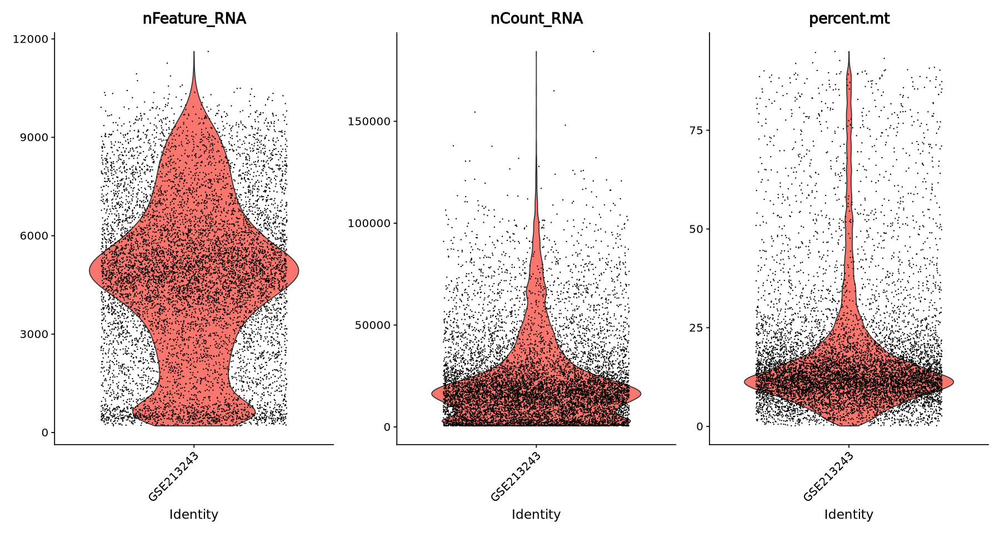

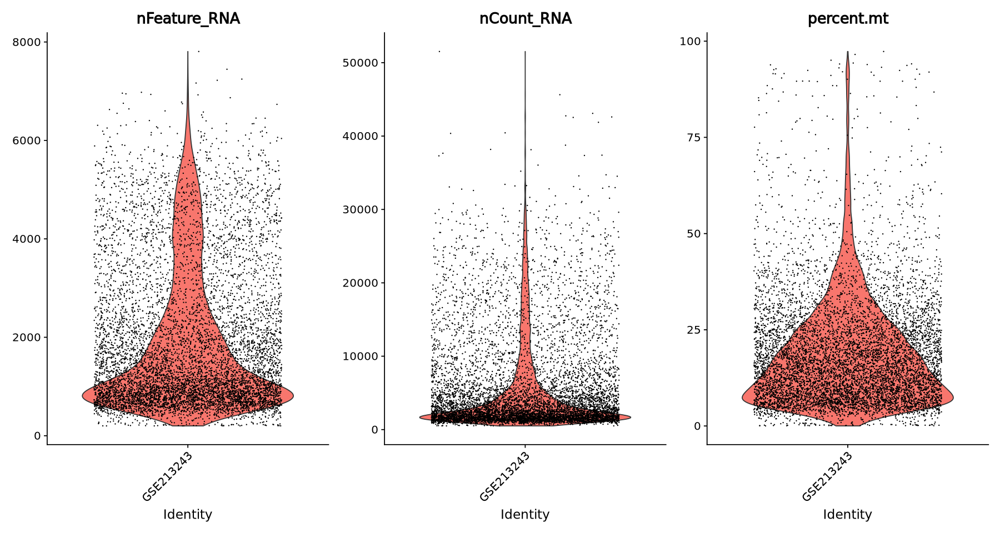

In [17]:
#QC Steps 
OC_Tu[["percent.mt"]] <- PercentageFeatureSet(OC_Tu, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(OC_Tu, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

#QC Steps 
OC_As[["percent.mt"]] <- PercentageFeatureSet(OC_As, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(OC_As, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [18]:
#Normalise the data
OC_Tu <- NormalizeData(OC_Tu)
#Find variable features
OC_Tu <- FindVariableFeatures(OC_Tu, selection.method = "vst", nfeatures = 2000)
#Scale the data
OC_Tu <- ScaleData(OC_Tu, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
OC_Tu <- RunPCA(OC_Tu, features = VariableFeatures(object = OC_Tu))

Normalizing layer: counts

Finding variable features for layer counts

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix

PC_ 1 
Positive:  LAPTM5, TYROBP, FCER1G, SRGN, ITGB2, AIF1, RGS1, VIM, CD14, FCGRT 
	   TGFBI, C1QA, C1QC, SPP1, SPI1, MSR1, MS4A7, PLEK, FYB1, ZEB2 
	   ADAP2, LSP1, DAB2, GPNMB, FCGR2A, C1QB, CSF1R, EMP3, APOE, PTPRC 
Negative:  S100A13, CAPS, LEMD1, CTXN1, CHI3L1, MORN2, SLPI, MDK, IGFBP2, CLU 
	   TSPAN1, DNALI1, SMIM22, IGFBP5, METRN, RPL39L, RSPH1, C9orf116, STXBP6, ASRGL1 
	   SNHG29, CCDC74A, MACROD2, KIF9, KCNK15, C2orf88, PCSK1N, LPAR3, RBP1, TUBB4B 
PC_ 2 
Positive:  CENPW, IGFBP2, MARCKSL1, SNHG29, ZFAS1, MDK, MKI67, BIRC5, TPX2, PTTG1 
	   AQP5, CHI3L1, LEMD1, HMMR, CKS2, CDKN3, FGF18, ENHO, UBE2C, CALD1 
	   FOXM1, ASPM, GTSE1, CDCA3, CENPA, SNHG7, KRT19, CDCA8, MEX3A, TOP2A 
Negative:  C20orf85, CAPSL, C5orf49, MORN5, TUBA4B, CFAP126, FAM183A, WDR38, C1orf194, TEKT1 
	   CFAP45, RIIAD1, PIFO, GPR162, EFCAB1, ZMYND10, ROPN1L, RS

In [19]:
#Normalise the data
OC_As <- NormalizeData(OC_As)
#Find variable features
OC_As <- FindVariableFeatures(OC_As, selection.method = "vst", nfeatures = 2000)
#Scale the data
OC_As <- ScaleData(OC_As, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
OC_As <- RunPCA(OC_As, features = VariableFeatures(object = OC_As))

Normalizing layer: counts

Finding variable features for layer counts

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix

PC_ 1 
Positive:  CCL5, IL32, RPL23A, NKG7, GZMA, IL7R, LTB, RPS15A, RPL26, CD3G 
	   RPS27, CST7, TRBC2, CD3E, CD52, MZT2A, KLRD1, RPS25, RPL30, RPS3A 
	   GZMK, TRAC, PRF1, HIST1H4C, IFITM1, CD7, RPS23, CD3D, RPS7, RPL14 
Negative:  MAFB, CD163, CYBB, CD14, MARCKS, ADAP2, CTSB, PDK4, FCGR3A, FTL 
	   PSAP, DAB2, RBM47, LYVE1, HMOX1, GLUL, MS4A7, CEBPB, MARCO, C5AR1 
	   S100A9, TIMP1, MSR1, CTSL, FN1, SLC11A1, RNASE1, S100A8, CYFIP1, AIF1 
PC_ 2 
Positive:  C1QC, TREM2, C2, C1QB, MAF, CCL5, CYP27A1, FN1, LYVE1, IL7R 
	   TMEM37, SDC3, HAMP, CTSL, C1QA, IL32, FABP5, KLRD1, SAMD4A, COLEC12 
	   SLC2A5, MARCO, FOLR2, TIMD4, CD28, PLTP, FOXC1, ME1, NKG7, GPNMB 
Negative:  NAPSB, HLA-DQB1, HLA-DQA2, HLA-DQA1, HLA-DPA1, HLA-DPB1, CD74, HLA-DRA, BCL11A, HLA-DRB1 
	   PLD4, HLA-DOA, HLA-DRB5, TCF4, CIITA, CD1C, FLT3, HLA-DRB6, PPP1R14A, AFF3 
	   GP

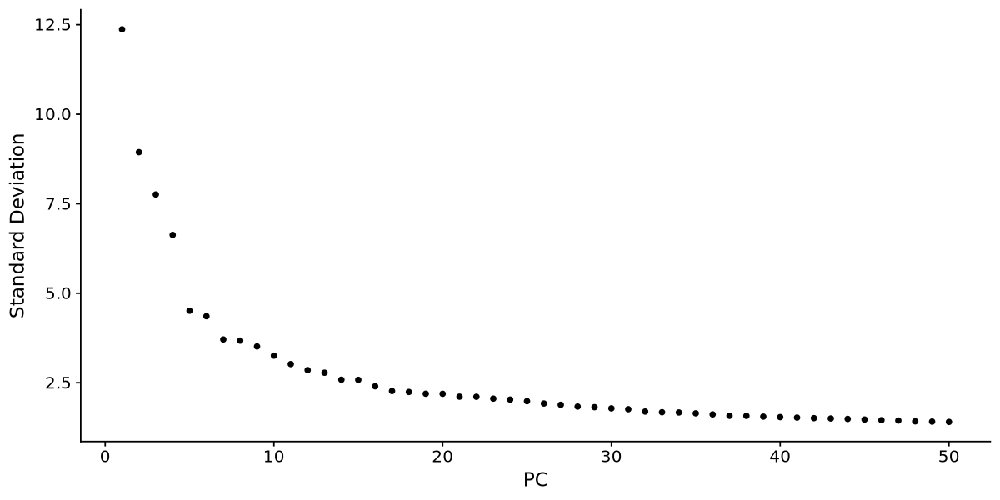

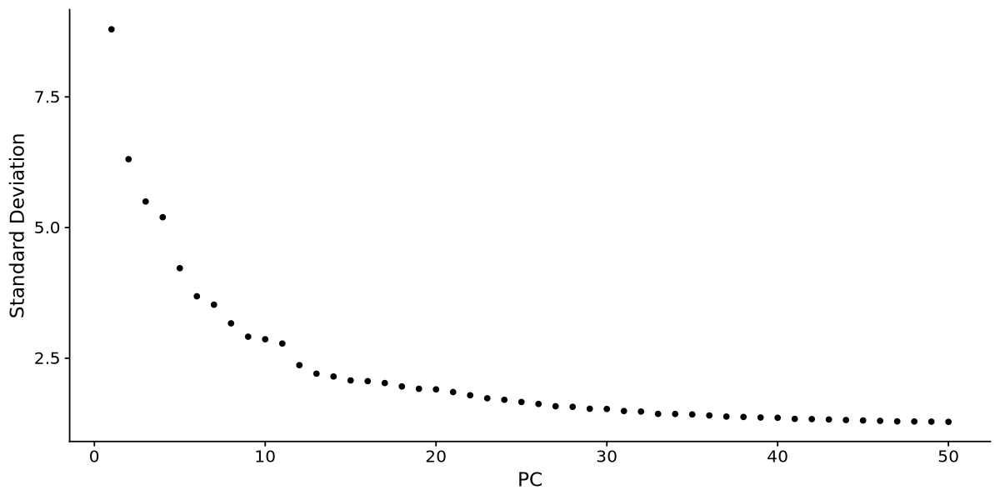

In [20]:
#make elbow plot
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(OC_Tu, ndims=50)
#using 40

#make elbow plot
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(OC_As, ndims=50)
#using 40

In [21]:
#Find neighbours (make sure number matches no. features chosen above)
OC_Tu <- FindNeighbors(OC_Tu, dims = 1:40)

OC_As <- FindNeighbors(OC_As, dims = 1:40)

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN



In [22]:
#Run UMAP
OC_Tu <- RunUMAP(OC_Tu, dims = 1:40)
OC_As <- RunUMAP(OC_As, dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
11:13:15 UMAP embedding parameters a = 0.9922 b = 1.112

11:13:15 Read 9218 rows and found 40 numeric columns

11:13:15 Using Annoy for neighbor search, n_neighbors = 30

11:13:15 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

11:13:16 Writing NN index file to temp file /scratch/temp/9577985/RtmplUhccR/file28666e601c2511

11:13:16 Searching Annoy index using 1 thread, search_k = 3000

11:13:18 Annoy recall = 100%

11:13:18 Commencing smooth kNN distance calibration using 1 thread
 with t

In [23]:
#Cluster, resolution here set to 0.5
OC_Tu <- FindClusters(OC_Tu, resolution = 0.5)
OC_As <- FindClusters(OC_As, resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 9218
Number of edges: 339486

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8858
Number of communities: 14
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 8116
Number of edges: 356013

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8643
Number of communities: 15
Elapsed time: 0 seconds


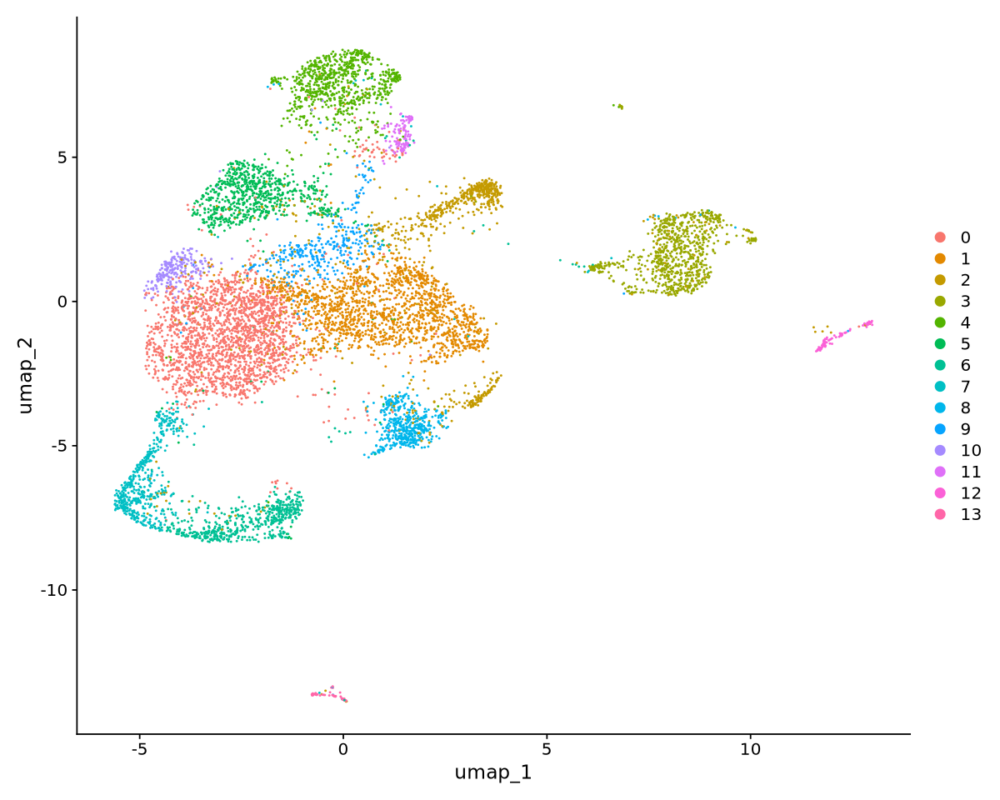

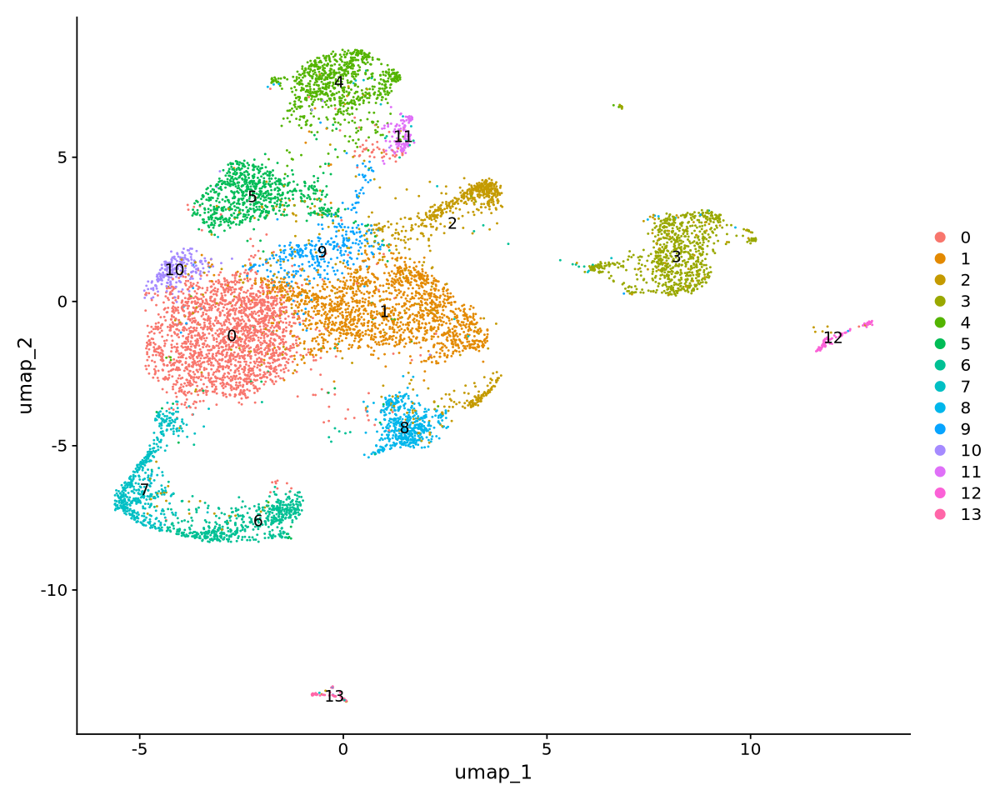

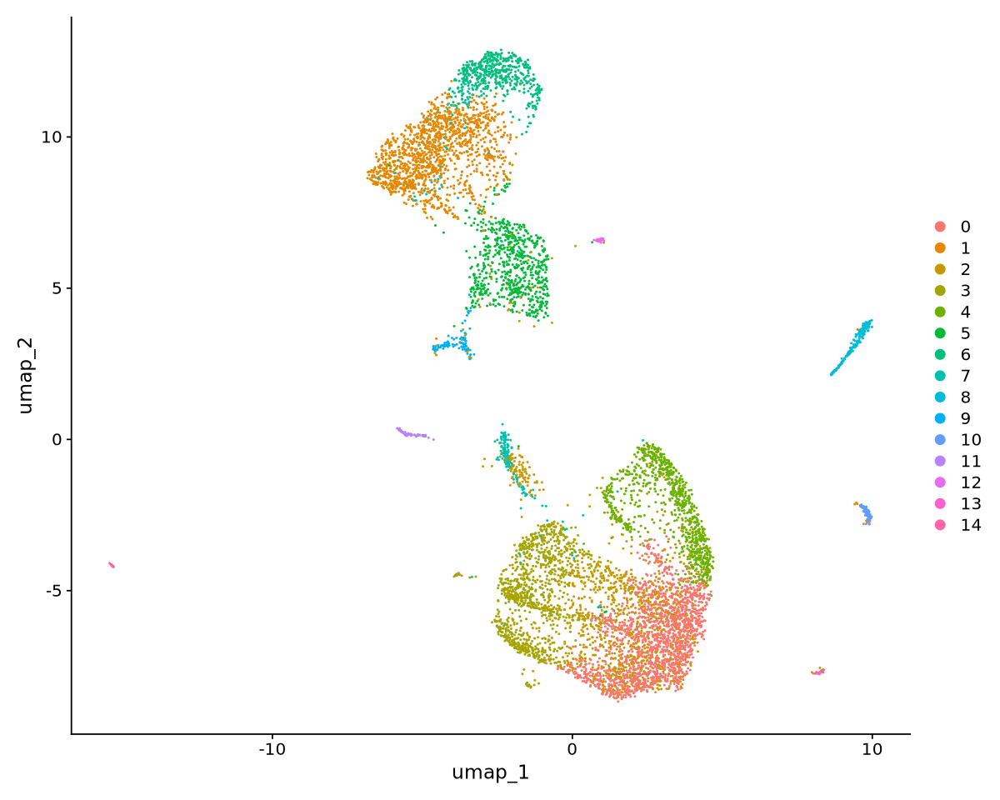

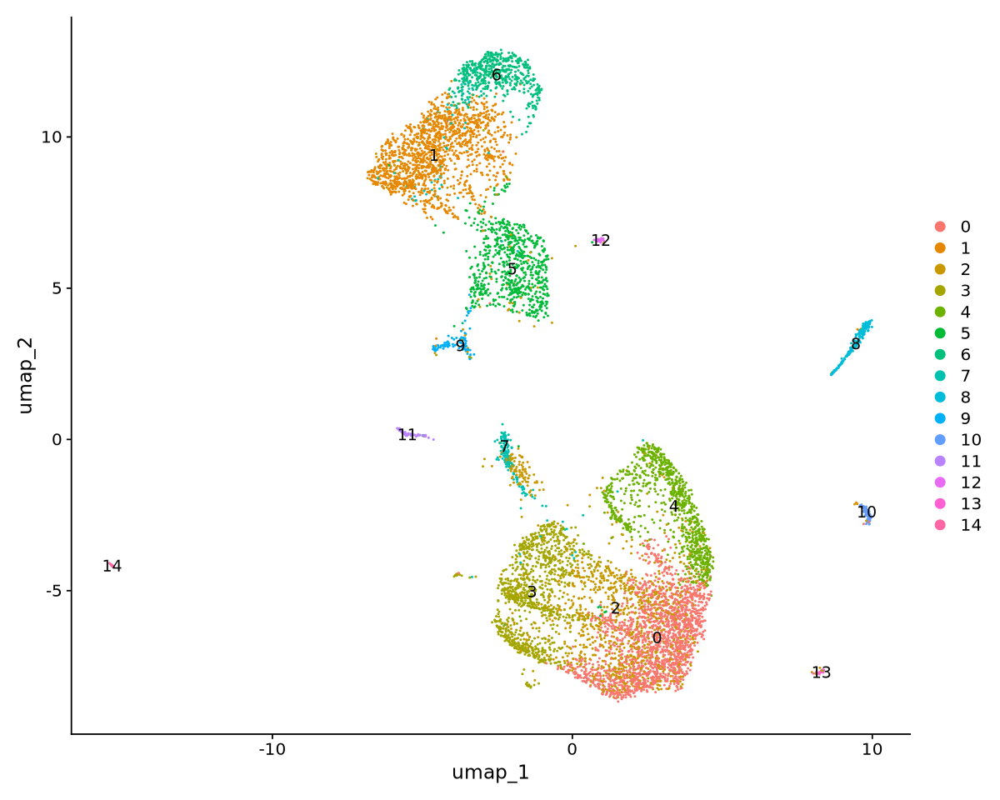

In [24]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(OC_Tu, reduction = "umap")
DimPlot(OC_Tu, reduction = "umap", label=TRUE)

DimPlot(OC_As, reduction = "umap")
DimPlot(OC_As, reduction = "umap", label=TRUE)

In [25]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(OC_Tu, file = "/scratch/user/s4436039/scdata/GSE213243/GSE213243_Tumour.RDS")
saveRDS(OC_As, file = "/scratch/user/s4436039/scdata/GSE213243/GSE213243_Ascites.RDS")

#### Next part of code is about determining which cluster is the myeloid cells

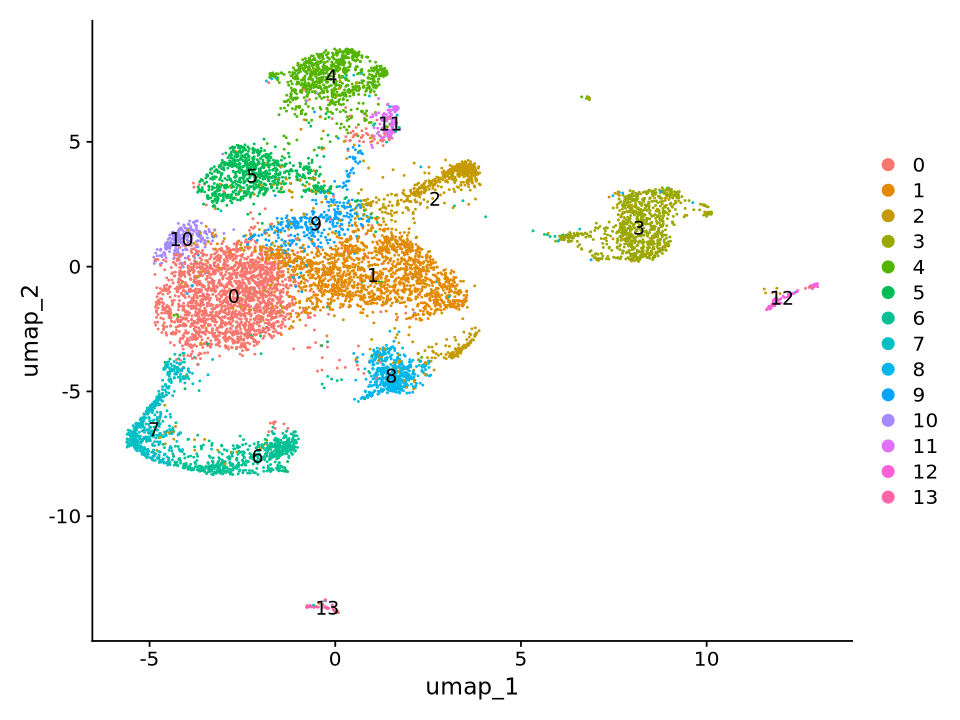

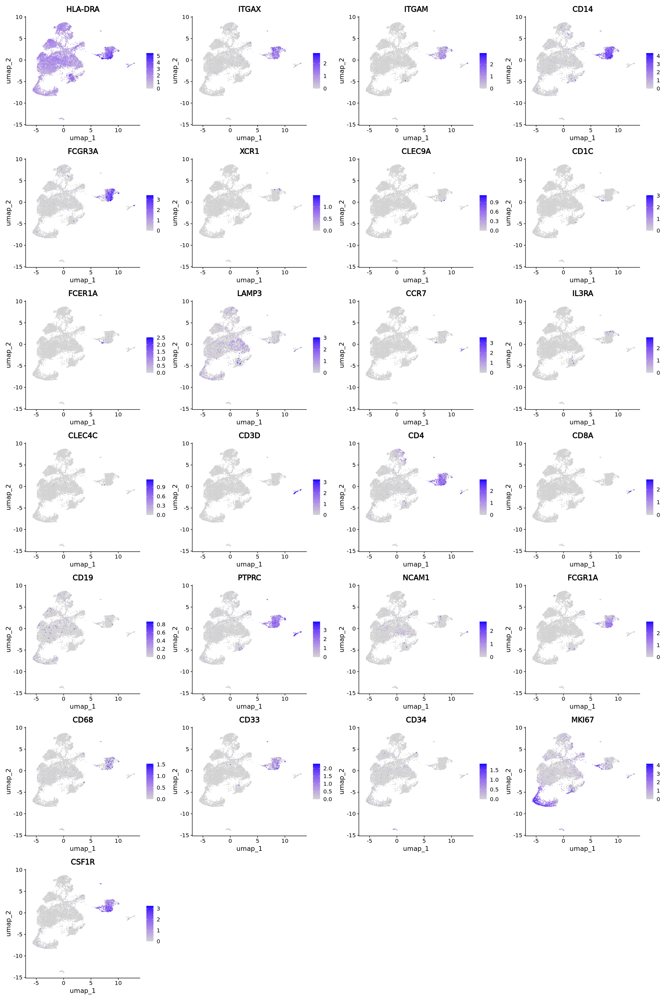

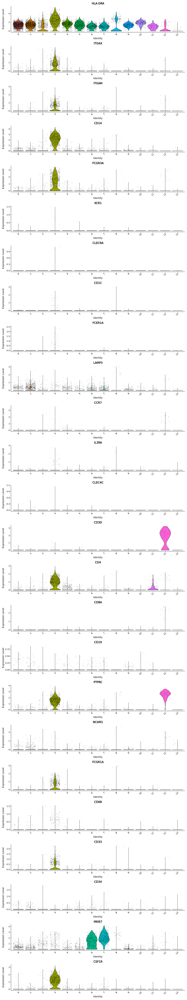

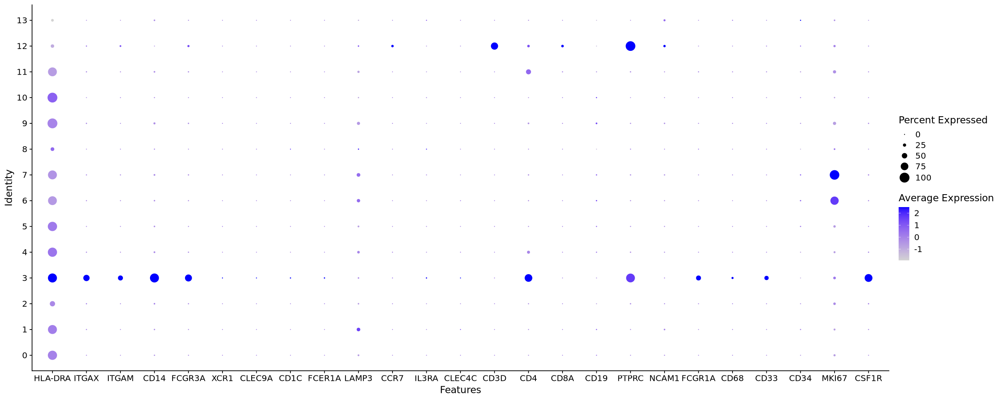

In [26]:
#genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(OC_Tu, reduction = "umap", label=TRUE)

options(repr.plot.height=30, repr.plot.width=20)
FeaturePlot(OC_Tu, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(OC_Tu, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(OC_Tu, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))
     

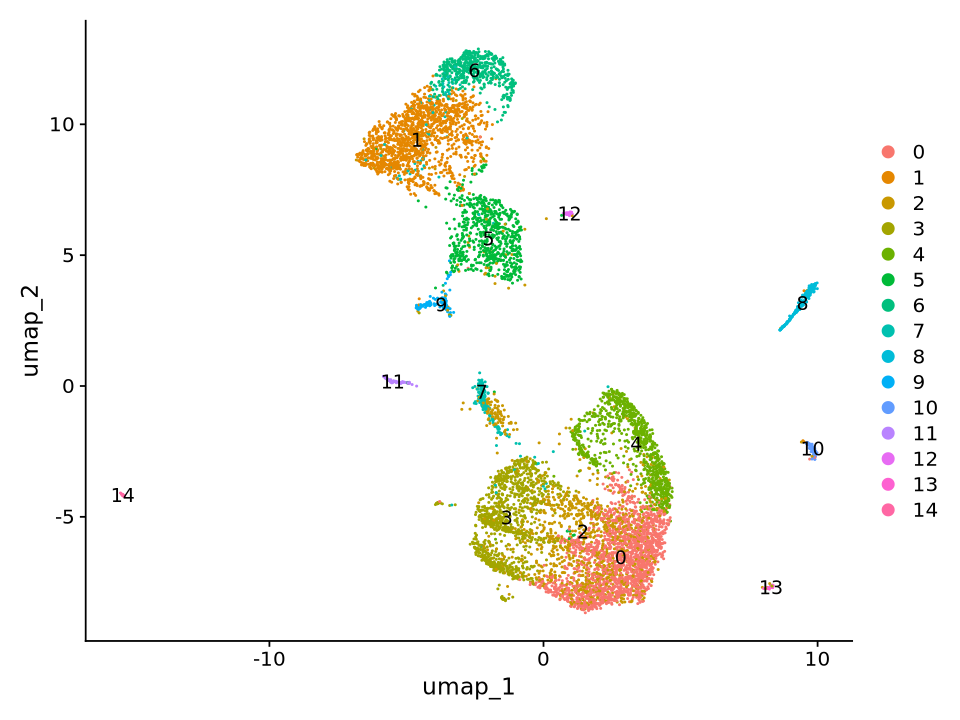

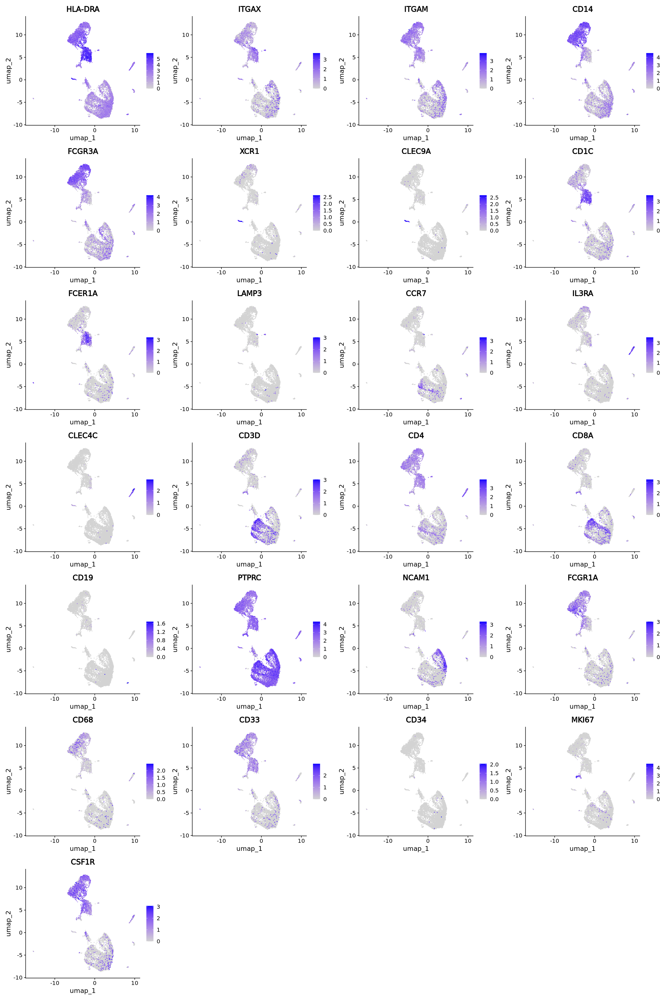

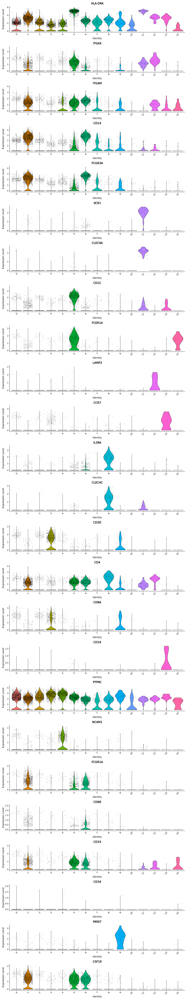

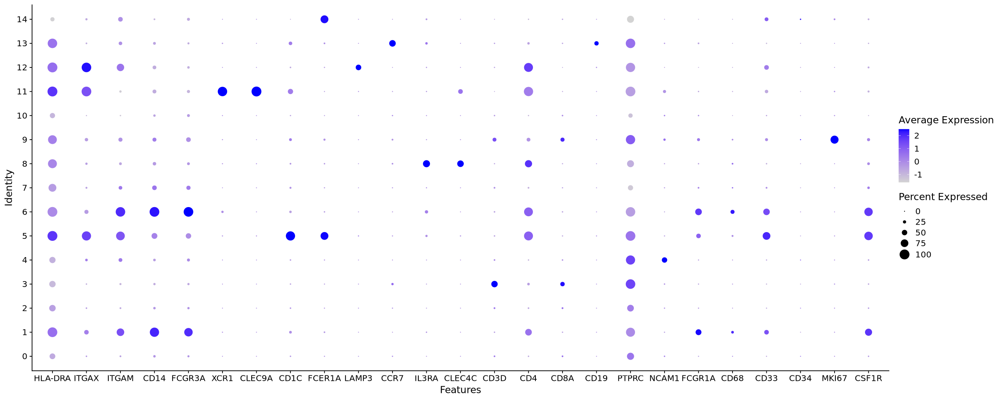

In [27]:
#genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(OC_As, reduction = "umap", label=TRUE)

options(repr.plot.height=30, repr.plot.width=20)
FeaturePlot(OC_As, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(OC_As, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(OC_As, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))
     

#### For the tumour: From above it looks like cluster 3 is the myeloid cells, now subsetting out cluster 3
#### For the ascites: From above it looks like clusters 1 (macs),5(DC2),6(macs),11(DC1),12(mregDC) are the myeloid cells, now subsetting out these clusters

In [28]:
head(OC_Tu@meta.data)
head(OC_As@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.5,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
GSE213243_tumour_AAACCCAAGCATGTTC-1,GSE213243,662,511,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour,3.172205,8,8
GSE213243_tumour_AAACCCACAAGCAATA-1,GSE213243,32154,5908,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour,14.539404,0,0
GSE213243_tumour_AAACCCAGTCGTCAGC-1,GSE213243,12781,4054,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour,10.241765,7,7
GSE213243_tumour_AAACCCAGTGACGTCC-1,GSE213243,557,402,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour,8.078995,8,8
GSE213243_tumour_AAACCCATCACAAGAA-1,GSE213243,20367,5210,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour,16.266510,0,0
GSE213243_tumour_AAACCCATCCGTATAG-1,GSE213243,7222,2839,tumour,HGSOC,pt-1,GSE213243_HGSOC_tumour,15.951260,7,7


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.5,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
GSE213243_ascites_AAACCCAAGCTACTGT-2,GSE213243,1369,775,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites,20.964207,2,2
GSE213243_ascites_AAACCCAAGGGCAATC-2,GSE213243,1217,606,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites,32.046015,2,2
GSE213243_ascites_AAACCCAAGTAGCAAT-2,GSE213243,16943,4684,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites,7.572449,5,5
GSE213243_ascites_AAACCCACAGCTGTGC-2,GSE213243,729,431,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites,24.279835,0,0
GSE213243_ascites_AAACCCACAGTCGTTA-2,GSE213243,14219,3822,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites,5.021450,1,1
GSE213243_ascites_AAACCCAGTAATGATG-2,GSE213243,2221,1149,ascites,HGSOC,pt-1,GSE213243_HGSOC_ascites,15.488519,3,3


In [29]:
myeloid_OC_Tu <- subset(OC_Tu, subset = RNA_snn_res.0.5 %in% c("3"))
myeloid_OC_As <- subset(OC_As, subset = RNA_snn_res.0.5 %in% c("1","5","6","11","12"))

In [30]:
myeloid_OC_Tu
myeloid_OC_As

An object of class Seurat 
58825 features across 804 samples within 1 assay 
Active assay: RNA (58825 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
58825 features across 2688 samples within 1 assay 
Active assay: RNA (58825 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

In [31]:
saveRDS(myeloid_OC_Tu, "/scratch/user/s4436039/scdata/GSE213243/GSE213243_Tumour_myeloid.RDS")
saveRDS(myeloid_OC_As, "/scratch/user/s4436039/scdata/GSE213243/GSE213243_Ascites_myeloid.RDS")

#### Following the above then need to move entire GSE213243 folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/GSE213243/ /QRISdata/Q5935/nikita/scdata/GSE213243
```